In [1]:
import pandas as pd
import numpy as np
import scipy

from matplotlib import gridspec
import matplotlib.pyplot as plt
import seaborn as sns

from google.cloud import bigquery as bq

%matplotlib inline

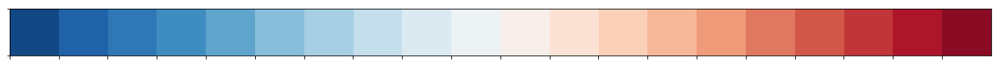

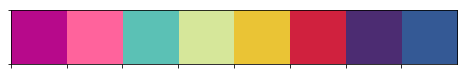

In [2]:
sns.palplot(sns.color_palette("RdBu_r", n_colors=20))
sns.palplot(sns.color_palette(["#b7098b","#ff639c", "#5bc1b5", "#d6e79a", "#eac435", "#d0213e", "#4c2c72", "#345995"]))

In [3]:
probe_ids = pd.read_table("./metadata/sig-DMD.union.includeERR.hm450probes", sep="\t", header=None)
probe_ids.columns = ['chrom', 'start', 'end', 'probe_id', 
                     'RefGene_Group', 'RefGene_Accession', 'RefGene_Name', 
                     'sig-DMD', 'DMV', 'pairs', 'nopairs']

print(probe_ids.shape)
probe_ids.head()

(25329, 11)


,chrom,start,end,probe_id,RefGene_Group,RefGene_Accession,RefGene_Name,sig-DMD,DMV,pairs,nopairs
0,chr1,864878,864880,cg02896266,Body,NM_152486,SAMD11,sig-DMD_1,DMV_4,"nontrip_trip,normal_trip",2
1,chr1,931326,931328,cg03648020,NaN,NaN,NaN,sig-DMD_2,DMV_6,"nontrip_trip,normal_nontrip,normal_trip",3
2,chr1,933305,933307,cg01729262,NaN,NaN,NaN,sig-DMD_2,DMV_6,"nontrip_trip,normal_nontrip,normal_trip",3
3,chr1,933387,933389,cg15882305,NaN,NaN,NaN,sig-DMD_2,DMV_6,"nontrip_trip,normal_nontrip,normal_trip",3
4,chr1,933684,933686,cg15713103,NaN,NaN,NaN,sig-DMD_2,DMV_6,"nontrip_trip,normal_nontrip,normal_trip",3


In [4]:
subtype_meth_bigtable = pd.read_table("./datasets/subtype_meth_bigtable.HM450.tsv", sep="\t")

print(subtype_meth_bigtable.shape)
subtype_meth_bigtable.head()

/home/singuyen/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3020: DtypeWarning: Columns (10,11,12) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


(20220571, 15)


,case_barcode,sample_barcode,aliquot_barcode,probe_id,avg_beta_value,sample_type,sample_type_name,subtype,ER,PR,Her2_IHC,Her2_ISH,Her2,triple_negative,subtype_sub
0,TCGA-A7-A13E,TCGA-A7-A13E-01A,TCGA-A7-A13E-01A-11D-A12R-05,cg21064449,0.95,1,Primary solid Tumor,Basal,Positive,Negative,2+,Negative,Negative,Unknown,Basal
1,TCGA-A7-A13E,TCGA-A7-A13E-01A,TCGA-A7-A13E-01A-11D-A12R-05,cg16108964,0.95,1,Primary solid Tumor,Basal,Positive,Negative,2+,Negative,Negative,Unknown,Basal
2,TCGA-A7-A13E,TCGA-A7-A13E-01A,TCGA-A7-A13E-01A-11D-A12R-05,cg00610360,0.95,1,Primary solid Tumor,Basal,Positive,Negative,2+,Negative,Negative,Unknown,Basal
3,TCGA-A7-A13E,TCGA-A7-A13E-01A,TCGA-A7-A13E-01A-11D-A12R-05,cg09873164,0.96,1,Primary solid Tumor,Basal,Positive,Negative,2+,Negative,Negative,Unknown,Basal
4,TCGA-A7-A13E,TCGA-A7-A13E-01A,TCGA-A7-A13E-01A-11D-A12R-05,cg24997276,0.95,1,Primary solid Tumor,Basal,Positive,Negative,2+,Negative,Negative,Unknown,Basal


In [5]:
print("Sample types")
print(subtype_meth_bigtable.drop_duplicates(subset="sample_barcode").sample_type_name.value_counts())
print("\n")

print("BRCA subtypes")
print(subtype_meth_bigtable.drop_duplicates(subset="case_barcode").subtype_sub.value_counts())

Sample types
Primary solid Tumor    789
Solid Tissue Normal     98
Metastatic               5
Name: sample_type_name, dtype: int64


BRCA subtypes
LumA        391
LumB        135
Normal       77
Basal        76
Basal-TN     53
Her2         45
Unknown      12
Name: subtype_sub, dtype: int64


In [6]:
meth_matrix = subtype_meth_bigtable.pivot(index='probe_id', columns='aliquot_barcode', values='avg_beta_value')

print(meth_matrix.shape)
meth_matrix.head()

(22638, 894)


aliquot_barcode,TCGA-3C-AAAU-01A-11D-A41Q-05,TCGA-3C-AALI-01A-11D-A41Q-05,TCGA-3C-AALJ-01A-31D-A41Q-05,TCGA-3C-AALK-01A-11D-A41Q-05,TCGA-4H-AAAK-01A-12D-A41Q-05,TCGA-5L-AAT0-01A-12D-A41Q-05,TCGA-5L-AAT1-01A-12D-A41Q-05,TCGA-5T-A9QA-01A-11D-A41Q-05,TCGA-A1-A0SB-01A-11D-A145-05,TCGA-A1-A0SE-01A-11D-A10P-05,...,TCGA-UL-AAZ6-01A-11D-A41Q-05,TCGA-UU-A93S-01A-21D-A41Q-05,TCGA-V7-A7HQ-01A-11D-A33F-05,TCGA-W8-A86G-01A-21D-A36K-05,TCGA-WT-AB41-01A-11D-A41Q-05,TCGA-WT-AB44-01A-11D-A41Q-05,TCGA-XX-A899-01A-11D-A36K-05,TCGA-XX-A89A-01A-11D-A36K-05,TCGA-Z7-A8R5-01A-42D-A41Q-05,TCGA-Z7-A8R6-01A-11D-A41Q-05
probe_id,,,,,,,,,,,,,,,,,,,,,
cg00000029,0.10,0.14,0.15,0.20,0.21,0.24,0.25,0.10,0.06,0.16,...,0.23,0.13,0.12,0.18,0.25,0.18,0.28,0.25,0.23,0.08
cg00000321,0.39,0.30,0.61,0.58,0.47,0.59,0.40,0.78,0.26,0.30,...,0.61,0.62,0.50,0.47,0.65,0.66,0.54,0.28,0.50,0.13
cg00000363,0.22,0.43,0.77,0.68,0.21,0.25,0.47,0.84,0.06,0.41,...,0.68,0.45,0.13,0.31,0.19,0.31,0.25,0.21,0.39,0.11
cg00001747,0.03,0.06,0.06,0.55,0.62,0.38,0.53,0.84,0.01,0.06,...,0.79,0.39,0.17,0.04,0.55,0.70,0.52,0.37,0.08,0.34
cg00002426,0.31,0.87,0.45,0.39,0.35,0.46,0.56,0.85,0.12,0.36,...,0.41,0.43,0.31,0.34,0.53,0.27,0.54,0.48,0.51,0.22


In [7]:
labels_aliquots = {}

labels_aliquots["Normal"] = list(subtype_meth_bigtable.loc[subtype_meth_bigtable['sample_type'] == 11, 
                                                           'aliquot_barcode'].unique())

labels_aliquots["Metastasis"] = list(subtype_meth_bigtable.loc[subtype_meth_bigtable['sample_type'] == 6, 
                                                               'aliquot_barcode'].unique())

labels_aliquots["Luminal A"] = list(subtype_meth_bigtable.loc[(subtype_meth_bigtable['sample_type'] == 1) & 
                                                              (subtype_meth_bigtable['subtype_sub'] == 'LumA'), 
                                                              'aliquot_barcode'].unique())

labels_aliquots["Luminal B"] = list(subtype_meth_bigtable.loc[(subtype_meth_bigtable['sample_type'] == 1) & 
                                                              (subtype_meth_bigtable['subtype_sub'] == 'LumB'), 
                                                              'aliquot_barcode'].unique())

labels_aliquots["Triple negative"] = list(subtype_meth_bigtable.loc[(subtype_meth_bigtable['sample_type'] == 1) & 
                                                          (subtype_meth_bigtable['subtype_sub'] == 'Basal-TN'), 
                                                          'aliquot_barcode'].unique())

labels_aliquots["Basal"] = list(subtype_meth_bigtable.loc[(subtype_meth_bigtable['sample_type'] == 1) & 
                                                          (subtype_meth_bigtable['subtype_sub'] == 'Basal'), 
                                                          'aliquot_barcode'].unique())

labels_aliquots["Her2"] = list(subtype_meth_bigtable.loc[(subtype_meth_bigtable['sample_type'] == 1) & 
                                                         (subtype_meth_bigtable['subtype_sub']== 'Her2'), 
                                                         'aliquot_barcode'].unique())

labels_aliquots["Normal-like"] = list(subtype_meth_bigtable.loc[(subtype_meth_bigtable['sample_type'] == 1) & 
                                                                (subtype_meth_bigtable['subtype_sub'] == 'Normal'), 
                                                                'aliquot_barcode'].unique())

labels=[]
subtypes=[]
for k, v in labels_aliquots.items():
    print(len(v))
    labels.append(k)
    subtypes = subtypes + v

98
5
421
147
57
78
46
34


In [8]:
print(labels)

['Normal', 'Metastasis', 'Luminal A', 'Luminal B', 'Triple negative', 'Basal', 'Her2', 'Normal-like']


# All subtype-specific sig-DMDs

In [9]:
meth_matrix = meth_matrix.loc[:,subtypes]
sort_order = [item for key in ['Normal', 'Luminal A', 'Luminal B'] for item in labels_aliquots[key]]
meth_matrix.sort_values(by=sort_order, inplace=True)
meth_matrix.shape

(22638, 886)

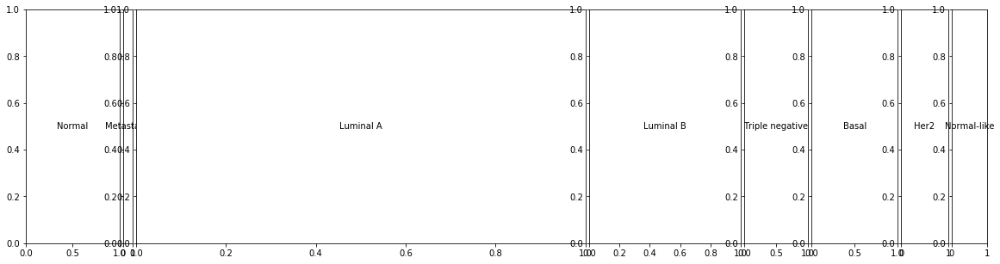

In [10]:
grid_kws = {"width_ratios": (0.1, 0.01, 0.48, 0.162, 0.068, 0.092, 0.05, 0.038), "wspace": 0.03}
fig, axes = plt.subplots(1, 8, figsize=(20,5), gridspec_kw=grid_kws)

for label, ax in zip(labels, axes):
    ax.text(0.5, 0.5, label, va="center", ha="center")

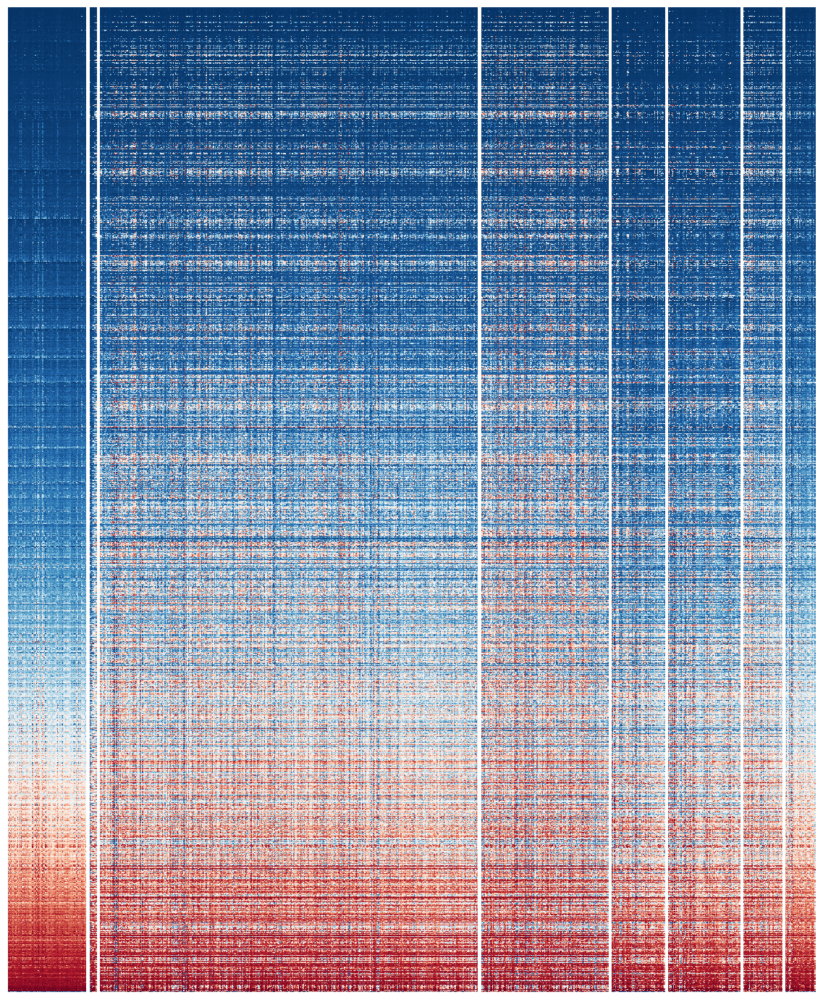

In [11]:
grid_kws = {"width_ratios": (0.1, 0.01, 0.48, 0.162, 0.068, 0.092, 0.05, 0.038), "wspace": 0.03}
fig, axes = plt.subplots(1, 8, figsize=(20,25), gridspec_kw=grid_kws)

for label, ax in zip(labels, axes):
    sns.heatmap(data=meth_matrix.loc[:, labels_aliquots[label]], 
                cmap="RdBu_r", vmin=0, vmax=1, 
                ax=ax, cbar=False, 
                xticklabels=False, yticklabels=False)
    ax.set_ylabel('')    
    ax.set_xlabel('')

In [12]:
fig.savefig("./plots/methdata.subtype.png", bbox_inches = 'tight', transparent=True)

# BRCA signatures

In [9]:
indices = probe_ids['pairs'].apply(lambda x: True if ("normal_trip" in x.split(",")) & 
                                                       ("normal_nontrip" in x.split(",")) 
                                             else False)

print( len( probe_ids.loc[indices, 'sig-DMD'].unique() ) )

brca_probe_id = probe_ids.loc[indices, 'probe_id']
len(brca_probe_id)

2043


17862

In [10]:
meth_matrix = meth_matrix.loc[meth_matrix.index.intersection(brca_probe_id), 
                              subtypes]
sort_order = [item for key in ['Normal', 'Luminal A', 'Luminal B'] for item in labels_aliquots[key]]
meth_matrix.sort_values(by=sort_order, inplace=True)
meth_matrix.shape

(16029, 886)

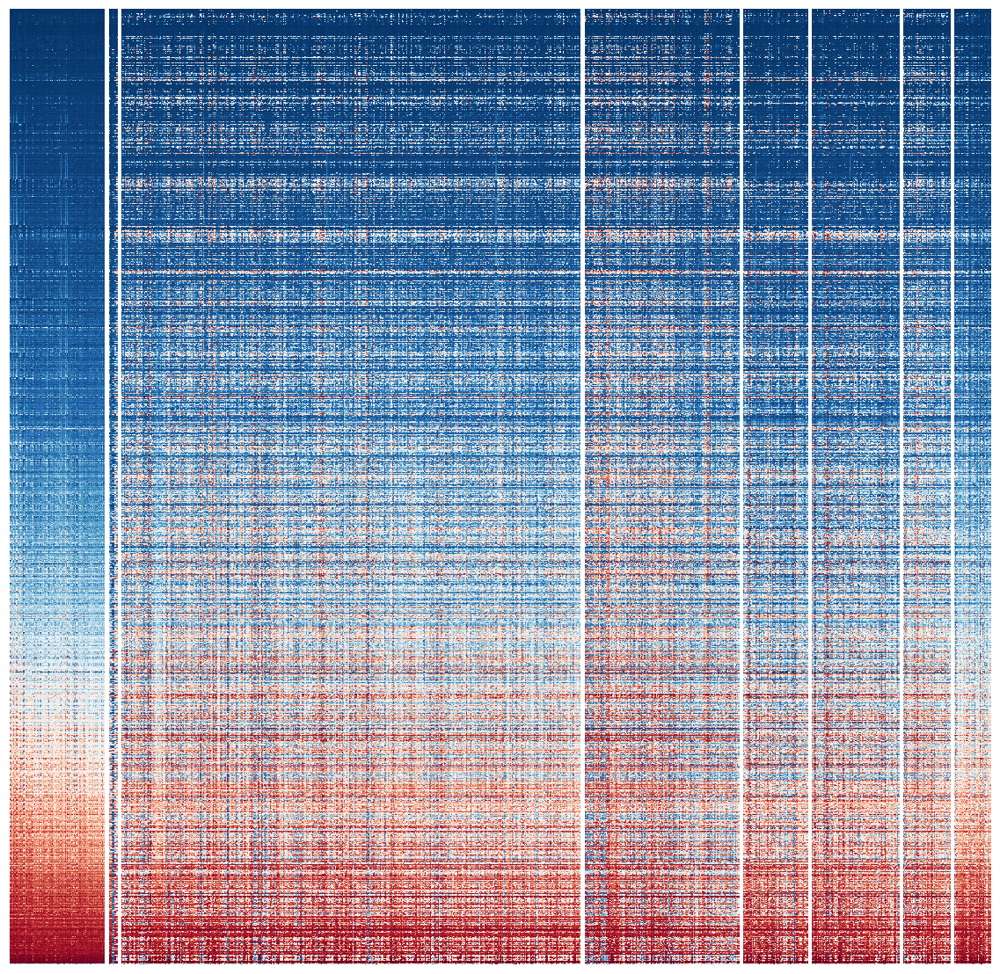

In [11]:
grid_kws = {"width_ratios": (0.1, 0.01, 0.48, 0.162, 0.068, 0.092, 0.05, 0.038), "wspace": 0.03}
fig, axes = plt.subplots(1, 8, figsize=(20,20), gridspec_kw=grid_kws)

for label, ax in zip(labels, axes):
    sns.heatmap(data=meth_matrix.loc[:, labels_aliquots[label]], 
                cmap="RdBu_r", vmin=0, vmax=1, 
                ax=ax, cbar=False, 
                xticklabels=False, yticklabels=False)
    ax.set_ylabel('')    
    ax.set_xlabel('')

In [13]:
fig.savefig("./plots/methdata.subtype.BRCAsigDMD.png", bbox_inches = 'tight', transparent=True)

# Tripple-negative (TN-BRCA) signatures

In [9]:
indices = probe_ids['pairs'].apply(lambda x: True if ("normal_trip" in x.split(",")) & 
                                                       ("nontrip_trip" in x.split(",")) 
                                             else False)

print( len( probe_ids.loc[indices, 'sig-DMD'].unique() ) )

trip_probe_id = probe_ids.loc[indices, 'probe_id']
len(trip_probe_id)

891


7805

In [10]:
meth_matrix = meth_matrix.loc[meth_matrix.index.intersection(trip_probe_id), 
                              subtypes]
sort_order = [item for key in ['Basal'] for item in labels_aliquots[key]]
meth_matrix.sort_values(by=sort_order, inplace=True)
meth_matrix.shape

(7005, 886)

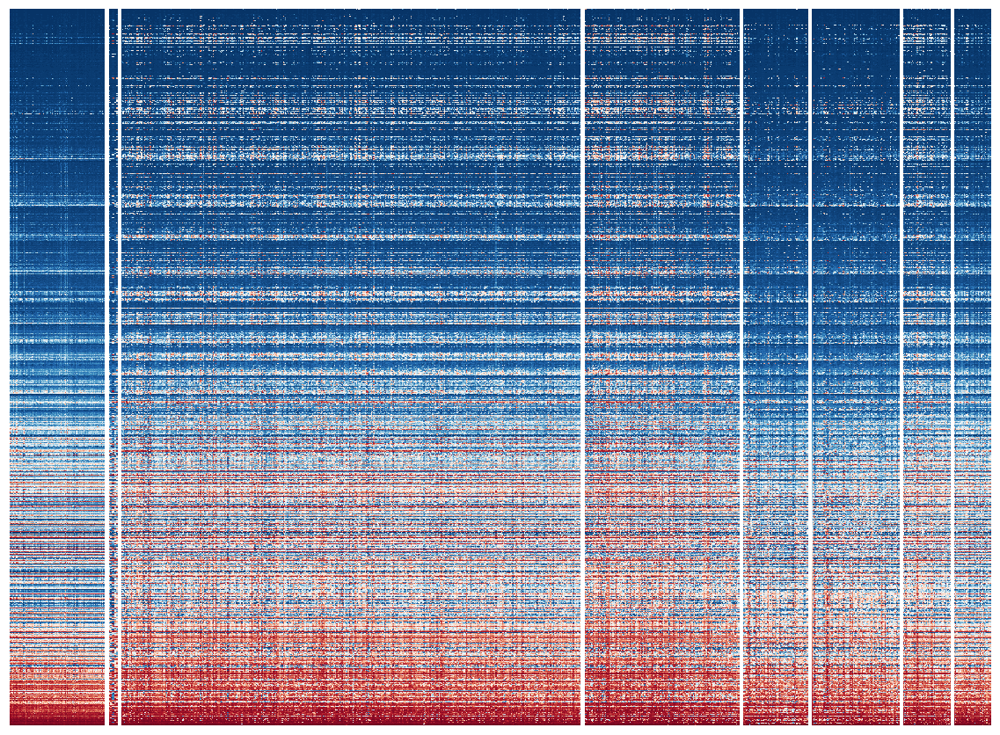

In [11]:
grid_kws = {"width_ratios": (0.1, 0.01, 0.48, 0.162, 0.068, 0.092, 0.05, 0.038), "wspace": 0.03}
fig, axes = plt.subplots(1, 8, figsize=(20,15), gridspec_kw=grid_kws)

for label, ax in zip(labels, axes):
    sns.heatmap(data=meth_matrix.loc[:, labels_aliquots[label]], 
                cmap="RdBu_r", vmin=0, vmax=1, 
                ax=ax, cbar=False, 
                xticklabels=False, yticklabels=False)
    ax.set_ylabel('')    
    ax.set_xlabel('')

In [12]:
fig.savefig("./plots/methdata.subtype.TNBRCAsigDMD.png", bbox_inches = 'tight', transparent=True)

# Non-Tripple-negative (nonTN-BRCA) signatures

In [9]:
indices = probe_ids['pairs'].apply(lambda x: True if ("normal_nontrip" in x.split(",")) & 
                                                       ("nontrip_trip" in x.split(",")) 
                                             else False)

print( len( probe_ids.loc[indices, 'sig-DMD'].unique() ) )

nontrip_probe_id = probe_ids.loc[indices, 'probe_id']
len(nontrip_probe_id)

897


9351

In [10]:
meth_matrix = meth_matrix.loc[meth_matrix.index.intersection(nontrip_probe_id), 
                              subtypes]
sort_order = [item for key in ['Luminal A', 'Luminal B'] for item in labels_aliquots[key]]
meth_matrix.sort_values(by=sort_order, inplace=True)
meth_matrix.shape

(8580, 886)

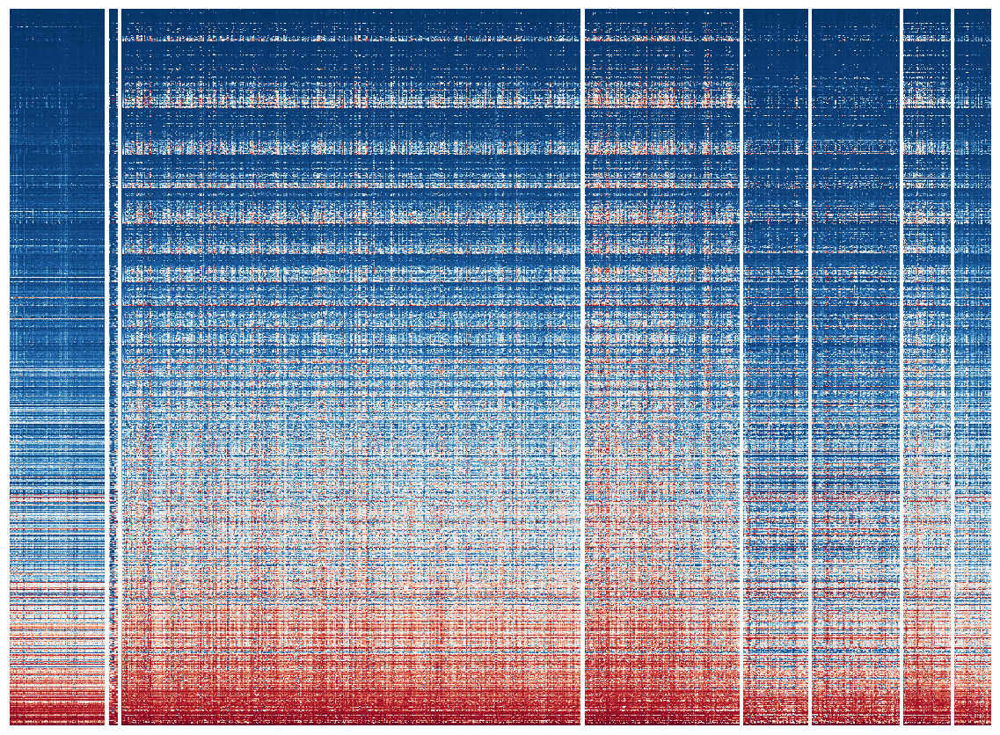

In [11]:
grid_kws = {"width_ratios": (0.1, 0.01, 0.48, 0.162, 0.068, 0.092, 0.05, 0.038), "wspace": 0.03}
fig, axes = plt.subplots(1, 8, figsize=(20,15), gridspec_kw=grid_kws)

for label, ax in zip(labels, axes):
    sns.heatmap(data=meth_matrix.loc[:, labels_aliquots[label]], 
                cmap="RdBu_r", vmin=0, vmax=1, 
                ax=ax, cbar=False, 
                xticklabels=False, yticklabels=False)
    ax.set_ylabel('')    
    ax.set_xlabel('')

In [12]:
fig.savefig("./plots/methdata.subtype.nonTNBRCAsigDMD.png", bbox_inches = 'tight', transparent=True)